In [2]:
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import cartopy.feature as cfeat
import cartopy.crs as ccrs
import seaborn as sns

In [3]:
area = xr.open_mfdataset("D:/UGP/datasets/E_2003-2020_GLEAM_v3.5b_MO.nc").sel(lon = slice(50,110), lat = slice(40,-20),time = slice("2003-01-01" , "2019-12-31")).transpose()
area

<xarray.Dataset>
Dimensions:  (lat: 240, lon: 240, time: 204)
Coordinates:
  * time     (time) datetime64[ns] 2003-01-16 2003-02-14T12:00:00 ... 2019-12-16
  * lon      (lon) float64 50.12 50.38 50.62 50.88 ... 109.1 109.4 109.6 109.9
  * lat      (lat) float64 39.88 39.62 39.38 39.12 ... -19.38 -19.62 -19.88
Data variables:
    E        (lat, lon, time) float64 dask.array<chunksize=(240, 240, 204), meta=np.ndarray>
Attributes:
    Dataset:      Global Land Evaporation Amsterdam Model
    Authors:      Hydro-Climate Extremes Lab (H-CEL)
    Institution:  Ghent University
    Contact:      info@gleam.eu
    Reference1:   Martens, B. et al 2017: GLEAM v3: satellite-based land evap...
    Reference2:   Miralles, D.G. et al. 2011: Global land-surface evaporation...
    Version:      3.5b (revision 2.0: fixed a snow mask error in 2020)

In [6]:
def make_figure():
    fig = plt.figure(figsize=(20, 10))
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

    # generate a basemap with country borders, oceans and coastlines
    ax.add_feature(cfeat.LAND)
    ax.add_feature(cfeat.OCEAN)
    ax.add_feature(cfeat.COASTLINE)
    ax.add_feature(cfeat.BORDERS, linestyle='dotted')
    return fig, ax

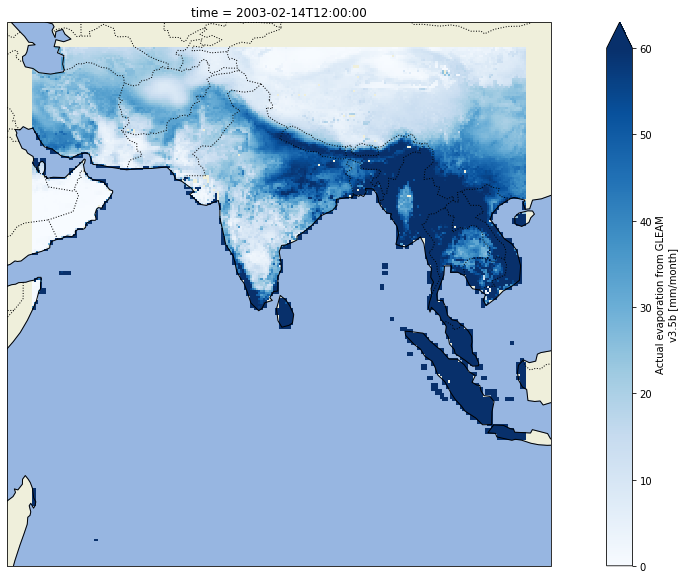

In [7]:
_, ax = make_figure()
grid = area.isel(time=1).E
grid.plot(ax=ax, transform=ccrs.PlateCarree(), cmap = "Blues" , vmin=0, vmax=60)

In [122]:
fig, ax = make_figure()

frames = area.time.size                      # Number of frames
min_value = float(area.precip.min().values)  # Lowest value
max_value = float(area.precip.max().values)  # Highest value

def draw(frame, add_colorbar):
    grid = area.isel(time=frame).precip
    contour = grid.plot(ax=ax, transform=ccrs.PlateCarree(),add_colorbar=add_colorbar, vmin=min_value, vmax=max_value , cmap = "Blues")
    title = "Time - " + str(grid.time.values)
    ax.set_title(title)
    return contour


def init():
    return draw(0, add_colorbar=True)


def animate(frame):
    return draw(frame, add_colorbar=False)


ani = animation.FuncAnimation(fig, animate, frames, interval=0.01, blit=False,init_func=init, repeat=False)
plt.close(fig)

In [ ]:
ani.save('gleam.mp4', writer=animation.FFMpegWriter(fps=5))